# Challenge 1: Geodemographic Classification

In this challenge, you will replicate the process of creating a geodemographic classification using the k-means clustering algorithm. Please select any city in the UK except London, Liverpool, or Glasgow. The main goal is to generate a meaningful and informative classification that captures the diversity of areas in your dataset using the census data ( For England, you can try to use the 2021 or 2011 census, and for Scotland, you need to use the 2011 census data) 

1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 
2. Look for census data from the selected city for which you would like to generate the geodemographic classification.
3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 
4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.
5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.
6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.
7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.
8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.
9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?
10. Map the final cluster groups
11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and the provided names.
12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an optimum classification for your specific purpose. Reflect on the challenges and insights gained during the classification process. Ensure you document your analytical decisions and the rationale behind any important decision. Once your geodemographics are constructed, describe the potential use cases for the geodemographic classification you have built based on your initial goal.

### 1. 

This geodemographic classiciation aims to assess the provision of public health marketing schemes, looking at areas that are in need of marketing for healthy lifestyles as a way to improve health and reduce pressure on the healthcare system. It will classify areas according to their different health characteristics, as well as their demographic and economic variables. I will use data from the 2022 Scotland Census at the output area level.

The following variables will be included to segment neighbourhoods. They are based on a range of factors that make generalisations about how lifestyle choices impact health, as well as general health statistics. 
* UV104 - marital and civil partnership status
* UV301 - provision of unpaid care
* UV302 - General health
* UV303 - Disability
* UV204 - Long-term health conditions
* UV407 - Central heating
* UV501 - Highest level of qualification
* UV601 - Economic Activity
* UV606 - Occupation
* UV703 - Distance travelled to work

(https://www.scotlandscensus.gov.uk/documents/2022-output-area-data/)

It is likely that the choice to include both economic activity, highest level of qualification and hours worked will be highly correlated and may need to be removed to avoid skewing results and keeping unique variables.

In [5]:
cd ..

/Users/milliemccallum/Documents/UA2/Lab6


### Preprocessing the census data 

In [9]:
import pandas as pd
import os

csv_directory = "data_6/challenge_data/census_2022/"

# create a list for the CSVs that will be used for the directory
csv_files = [file for file in os.listdir(csv_directory) if file.endswith(".csv")]

# Create an empty dataframe to put the merged set of csvs into
merged_data = pd.DataFrame()

# read the csvs and merge them
for csv_file in csv_files:
    csv_path = os.path.join(csv_directory, csv_file) 
    df_csv = pd.read_csv(csv_path, low_memory=False) 
    merged_data = pd.concat([merged_data, df_csv], axis=1)

merged_data.to_csv("data_6/challenge_data/census_2022/merged_challenge_census_data.csv", index=False)

In [ ]:
# create a filter for only Edinburgh so data only reflects this area, not the whole of Scotland 
# first filter the oa data to just the extent of Edinburgh 
# This is using data from https://geoportal.statistics.gov.uk/datasets/ons::local-authority-districts-may-2024-boundaries-uk-bfe-2/about 
# showing the boundaries of local authorities. I will select only the City of Edinburgh
# Due to the large file size of this data, please download it seperately into your on drive

import pandas as pd
import geopandas as gpd

shp_path = "data_6/challenge_data/edinburgh_oa/LAD_MAY_2024_UK_BFE.shp"
local_authorities = gpd.read_file(shp_path)

edinburgh = local_authorities[local_authorities["LAD24NM"] == "City of Edinburgh"]
edinburgh.head()

In [ ]:
import requests
import geopandas as gpd
from io import BytesIO

# Step 1: Fetch the GeoJSON data from the URL
url = "https://services1.arcgis.com/ESMARspQHYMw9BZ9/arcgis/rest/services/Local_Authority_Districts_May_2024_Boundaries_UK_BFE/FeatureServer/0/query?where=1%3D1&outFields=*&outSR=4326&f=json"
response = requests.get(url)

# Step 2: Check if the request was successful
if response.status_code == 200:
    # Convert the response into GeoJSON format
    LAD = response.json()

    # Step 3: Read the GeoJSON into a GeoDataFrame
    gdf = gpd.read_file(BytesIO(response.content))

    # Step 4: Save the GeoDataFrame as a shapefile
    gdf.to_file("local_authority_districts_2024.shp")

DriverError: '/vsimem/26e36fcdfac5435dad2c0e62ea5d3e59' not recognized as a supported file format.

In [10]:
# get the shapefile for the output areas of the whole of Scotland 
# and use the local authority outline to clip the output areas to the extent of Edinburgh 
oa_path = "data_6/challenge_data/edinburgh_oa/OutputArea2022_EoR.shp"
oa = gpd.read_file(oa_path)

# check crs match
print(oa.crs)
print(edinburgh.crs)

EPSG:27700


NameError: name 'edinburgh' is not defined

In [7]:
# clipping the oa data to the extent of edinburgh

oa_edinburgh = oa.clip(edinburgh.geometry)
oa_edinburgh.to_file("data_6/challenge_data/edinburgh_oa/oa_edinburgh.shp")
oa_edinburgh.head()

NameError: name 'oa' is not defined

In [6]:
# merging the oa data with the census data
import pandas as pd
import geopandas as gpd

csv_path = "data_6/challenge_data/census_2022/merged_challenge_census_data.csv"
csv_data = pd.read_csv(csv_path, low_memory=False)

merged_data = oa_edinburgh.merge(csv_data, left_on='code', right_on='oa_code', how='left')


NameError: name 'oa_edinburgh' is not defined

In [ ]:
merged_data.to_csv("data_6/challenge_data/census_merged", index=False)

### Processing the variables

In [ ]:
list(merged_data.columns)

In [ ]:
merged_data.info()

In [ ]:
merged_data.shape

In [ ]:
merged_data.head()

### Identifying key variables

In [ ]:
# sumarising data

merged_data['Bad'].describe()

In [ ]:
merged_data['Economically Active full-time students - Employee - Part-time'].describe()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

attributes_to_plot = ['Bad',
                      'Economically Active full-time students - Employee - Part-time',
                      'No qualifications',
                      'Yes, 20 to 34 hours a week']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.histplot(merged_data[attribute].astype(str), kde=True)
    plt.title(attribute)

plt.tight_layout()
plt.show()

### Standardising and subsetting the data 

21 variables have been selected from aspects of the census data on the following topics: 
* Health
* Education
* Employment
* Economic circumstances
* Relationship status
* Housing 

In [ ]:
def calculate_percentages(dataframe, total_columns, value_columns):

    result_df = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')
        
        result_df[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

    return result_df

# List of the corresponding totals.
total_cols = [
              'All people aged 16 and over', 'All people aged 16 and over', 
              'All people.1', 'All people.1',
              'All people.2','All people.2',
              'All people aged 16 and over.1', 'All people aged 16 and over.1',
              'All people aged 16 and over.2','All people aged 16 and over.2',
              'All people aged 3 and over', 'All people aged 3 and over',
              'All people.2','All people.2',
              'All people aged 16 and over in employment the week before the census.1', 'All people aged 16 and over in employment the week before the census.1',
              'All occupied households', 'All occupied households',
              'All people aged 16 to 74 in employment','All people aged 16 to 74 in employment',
              'All people aged 16 to 74 in employment' ]
# List of the corresponding values. 
value_cols = [
              'Economically Active (excluding full-time students) - Employee - Part-time', 'Economically Active (excluding full-time students) - Unemployed - Available for work',
              'Long-term illness, disease or condition', 'Mental health condition',
              'Bad', 'Very bad',
              'Divorced or civil partnership dissolved', 
              'Never married and never registered in a civil partnership',
              'No qualifications', 'Lower school qualifications', 'Upper school qualifications',
              'Yes, 35 to 49 hours a week', 'Yes, 50 or more hours a week',
              'Day-to-day activities limited a little',
              '16 to 30 hours', '31 to 48 hours',
              'Gas central heating: Mains gas', 'No central heating']
              
result_dataframe = calculate_percentages(merged_data, total_cols, value_cols)
              

In [ ]:
result_dataframe.head()

In [ ]:
result_dataframe.shape

In [ ]:
concatenated_df = pd.concat([merged_data, result_dataframe], axis=1, ignore_index=False)
concatenated_df.head()

In [ ]:
concatenated_df.shape

In [ ]:
list(concatenated_df.columns)

In [ ]:
keep_cols= [
    'code',
    'Popcount',
    'HHcount',
    'geometry',
    'Economically Active (excluding full-time students) - Employee - Part-time', 'Economically Active (excluding full-time students) - Unemployed - Available for work',
    'Long-term illness, disease or condition', 'Mental health condition',
    'Bad', 'Very bad',
    'Divorced or civil partnership dissolved', 
    'Never married and never registered in a civil partnership',
    'No qualifications', 'Lower school qualifications', 'Upper school qualifications',
    'Yes, 35 to 49 hours a week', 'Yes, 50 or more hours a week',
    'Day-to-day activities limited a little',
    '16 to 30 hours', '31 to 48 hours',
    'Gas central heating: Mains gas', 'No central heating']

edinburgh_census_data = concatenated_df[keep_cols]

In [ ]:
edinburgh_census_data.head()

In [ ]:
edinburgh_census_data.shape

### Standardising variables and measuring for association

In [ ]:
edinburgh_census_data.info()

In [ ]:
# calculate Z score for the variables selected 

numeric_columns = edinburgh_census_data.select_dtypes(include='float64')
z_score_df = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_df.head()

In [ ]:
# use the z-score to test for any correlations between variables
# the darker the colour, the more highly correlated the variables are 

corr = z_score_df.corr()
corr.style.background_gradient(cmap='coolwarm')

In [ ]:
# using an easier to read version of the above plot to identify correlated variables

import matplotlib.pyplot as plt

plt.matshow(z_score_df.corr())
plt.show()

In [ ]:
import seaborn as sns

threshold = 0.75
# set the threshold to 0.75 based on the correlations in the above plot

highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()

In [ ]:
# based on the above plot, remove highly correlated variables
z_score_df.drop(['Day-to-day activities limited a little', 'Mental health condition'], axis=1, inplace=True)
z_score_df.info()

In [ ]:
# retest the correlations of the variables 
corr_2 = z_score_df.corr()
corr_2.style.background_gradient(cmap='coolwarm')

In [ ]:
threshold = 0.75
highly_correlated_2 = (corr_2.abs() > threshold) & (corr_2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('New Highly Correlated Variables')
plt.show()

In [ ]:
# check for nan values in the df
# as this is true, the next steps remove these values
contains_nan = z_score_df.isna().any().any()
print(contains_nan)

In [ ]:
# use imputation to fill the nan values with the mean value of that column 

z_score_df.fillna(z_score_df.mean(), inplace=True)
z_score_df.head()

### K-means clustering

In [ ]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

# Start analysis with KMeans clustering with 10 clusters
kmeans = KMeans(n_clusters=10)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_
z_score_df['Cluster'] = kmeans.labels_

In [ ]:
z_score_df.head()

In [ ]:
plt.hist(labels)

there are no data points in cluster 3 or 6, therefore the number of clusters needs to be adjusted

In [ ]:
# use the elbow method to work out a more optimal number of clusters

Sum_of_squared_distances = []

K_range = range(1,15)

for k in K_range:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_df)
 Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K_range, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [ ]:
# the elbow appears to lie around 3, therefore the number of clusters will be adjusted appropriately

# I will also use a between-cluster sum of squares to measure the distinctiveness of 
# each cluster

import numpy as np
def elbow(dataframe, n):
    kMeansVar = [KMeans(n_clusters=k).fit(dataframe.values) for k in range(1, n)] #making use of list comprehensions.
    centroids = [X.cluster_centers_ for X in kMeansVar]
    k_euclid = [cdist(dataframe.values, cent) for cent in centroids]
    dist = [np.min(ke, axis=1) for ke in k_euclid]
    wcss = [sum(d**2) for d in dist]
    tss = sum(pdist(dataframe.values)**2)/dataframe.values.shape[0]
    bss = tss - wcss
    plt.plot(bss)
    plt.show()
 
elbow(z_score_df,15)

In [ ]:
# KMeans with 4 clusters, after the validation with the Elbow method.
kmeans = KMeans(n_clusters=4)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_

z_score_df['Cluster'] = kmeans.labels_

z_score_df.head()

# Evaluating the classification 

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.figure(figsize=(12, 8))

kmeans = KMeans(n_clusters=4)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA analysys.
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

# Create a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")

there are several clear outliers in the above plot which may skew the effectiveness of clustering 

In [ ]:
# assessing the variability in of each component included 

kmeans = KMeans(n_clusters=4)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

# Standardize the data for PCA
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('Cluster Plot against 1st 2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()

In [ ]:
# visualising the cluster centroids 

kmeans = KMeans(n_clusters=4)
clusters = kmeans.fit_predict(z_score_df)

cluster_centers = kmeans.cluster_centers_

cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_df.columns)

cluster_centers.head(3)

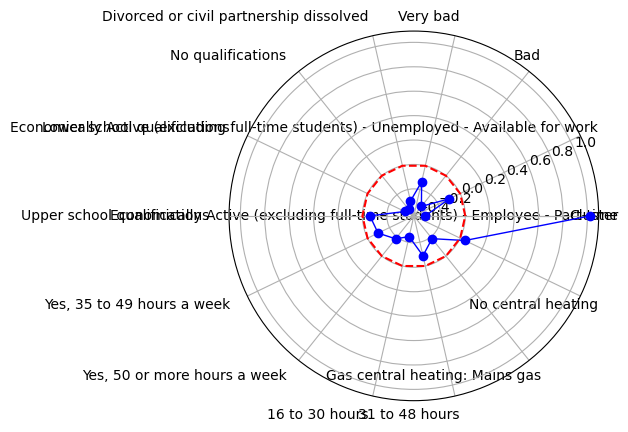

In [39]:
first_row_centers = cluster_centers.iloc[0, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()

### map the clusters

In [38]:
list(z_score_df.columns)

['Cluster']

In [ ]:
z_score_df.drop([
 'Economically Active (excluding full-time students) - Employee - Part-time',
 'Economically Active (excluding full-time students) - Unemployed - Available for work',
 'Bad',
 'Very bad',
 'Divorced or civil partnership dissolved',
 'No qualifications',
 'Lower school qualifications',
 'Upper school qualifications',
 'Yes, 35 to 49 hours a week',
 'Yes, 50 or more hours a week',
 '16 to 30 hours',
 '31 to 48 hours',
 'Gas central heating: Mains gas',
 'No central heating'], axis=1, inplace=True)
z_score_df.info()

In [ ]:
final_df = pd.concat([edinburgh_census_data, z_score_df], axis=1, ignore_index=False)
final_df.head()

In [ ]:
final_df.explore(column='Cluster', cmap='Set1', tiles='CartoDB positron')

### Adjusting the parameters 

In [42]:
def calculate_percentages(dataframe, total_columns, value_columns):

    result_df_2 = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')
        
        result_df_2[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

    return result_df_2

# List of the corresponding totals.
total_cols = [
              'All people aged 16 and over', 'All people aged 16 and over',
              'All people.1', 
              'All people.2','All people.2', 'All people.2',
              'All people aged 16 and over.1', 'All people aged 16 and over.1',
              'All people aged 16 and over.2','All people aged 16 and over.2', 'All people aged 16 and over.2',
              'All people aged 3 and over', 
              'All people.2',
              'All people aged 16 and over in employment the week before the census.1', 'All people aged 16 and over in employment the week before the census.1',
              'All people aged 16 and over in employment the week before the census.1', 'All occupied households', 'All occupied households',
              ]

# List of the corresponding values. 
value_cols = ['Economically Active (excluding full-time students) - Employee - Part-time', 'Economically inactive - Long term sick or disabled', 
              'Mental health condition',
              'Bad', 'Very bad', 'Fair', 
              'Divorced or civil partnership dissolved', 
              'Never married and never registered in a civil partnership',
              'No qualifications', 'Upper school qualifications', 'Apprenticeship qualifications',
              'All unpaid carers',
              'Day-to-day activities limited a little',
              '0 to 15 hours', '16 to 30 hours', '31 to 48 hours',
              'Gas central heating: Mains gas', 'No central heating']
              
result_dataframe_2 = calculate_percentages(merged_data, total_cols, value_cols)


In [43]:
result_dataframe.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage
0,18.110236,0.787402,17.763158,10.526316,0.657895,NaN,7.086614,22.047244,6.299213,9.448819,4.026846,NaN,1.315789,11.184211,15.217391,51.086957,10.526316,1.754386
1,16.091954,2.298851,21.495327,14.953271,4.672897,0.934579,14.942529,43.678161,6.896552,18.390805,11.320755,NaN,1.869159,14.953271,25.423729,57.627119,81.132075,7.547170
2,6.547619,NaN,13.333333,4.761905,0.952381,0.952381,4.761905,32.142857,11.904762,27.380952,11.917098,0.518135,1.904762,11.904762,10.784314,72.549020,60.810811,1.351351
3,15.748031,2.362205,11.801242,12.422360,2.484472,0.621118,10.236220,37.795276,8.661417,26.771654,6.410256,NaN,1.863354,8.074534,17.045455,65.909091,86.301370,1.369863
4,13.636364,2.272727,18.691589,17.757009,3.738318,1.869159,10.227273,37.500000,13.636364,35.227273,1.960784,0.980392,4.672897,9.345794,25.454545,49.090909,82.926829,12.195122


In [45]:
concatenated_df_2 = pd.concat([merged_data, result_dataframe_2], axis=1, ignore_index=False)
concatenated_df_2.head()

,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,Shape_Leng,...,No qualifications_percentage,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage
0,S00181358,57,152,S12000040,42.406623,4240.66,EH27 8DJA,311694,664406,40559.974240,...,6.299213,4.724409,1.574803,18.791946,11.184211,16.304348,15.217391,51.086957,10.526316,1.754386
1,S00145082,53,107,S12000036,0.015435,1.54,EH13 9AG,322867,669374,522.905774,...,6.896552,13.793103,6.896552,6.603774,14.953271,11.864407,25.423729,57.627119,81.132075,7.547170
2,S00144968,74,163,S12000036,0.364902,36.49,EH13 0PS,322069,669312,3842.367627,...,11.904762,13.690476,13.095238,4.663212,11.904762,1.960784,10.784314,72.549020,60.810811,1.351351
3,S00145050,73,161,S12000036,0.027922,2.79,EH13 9AW,323016,669327,1189.877306,...,8.661417,7.874016,4.724409,7.051282,8.074534,11.363636,17.045455,65.909091,86.301370,1.369863
4,S00145009,41,107,S12000036,0.059002,5.90,EH13 9DS,322836,669578,1700.931906,...,13.636364,2.272727,2.272727,14.705882,9.345794,9.090909,25.454545,49.090909,82.926829,12.195122


In [ ]:
list(concatenated_df_2.columns)

In [49]:
# Subsetting the attributes we need
keep_cols_2= [
    'code',
    'Popcount',
    'HHcount',
    'geometry',
    'Economically Active (excluding full-time students) - Employee - Part-time', 
    'Economically inactive - Long term sick or disabled', 
    'Mental health condition',
    'Bad', 
    'Very bad', 
    'Fair', 
    'Divorced or civil partnership dissolved', 
    'Never married and never registered in a civil partnership',
    'No qualifications', 
    'Upper school qualifications', 
    'Apprenticeship qualifications',
    'All unpaid carers',
    'Day-to-day activities limited a little',
    '0 to 15 hours', 
    '16 to 30 hours', 
    '31 to 48 hours',
    'Gas central heating: Mains gas', 
    'No central heating'
]

edinburgh_census_data_2 = concatenated_df_2[keep_cols_2]

In [51]:
edinburgh_census_data_2.shape

(4452, 22)

In [57]:
# rename columns to something that is more appropriate 

short_column_names = {'Economically Active (excluding full-time students) - Employee - Part-time': 'part_time',
    'Economically inactive - Long term sick or disabled': 'inactive', 
    'Mental health condition': 'mental_health',
    'Divorced or civil partnership dissolved': 'divorced', 
    'Never married and never registered in a civil partnership': 'single', 
    'No qualifications': 'no_qual',
    'Upper school qualifications': 'upper_qual', 
    'Apprenticeship qualifications': 'apprenticeship',
    'All unpaid carers': 'unpaid_carer',
    'Day-to-day activities limited a little': 'some_limitation'
                     }

edinburgh_census_data_2 = edinburgh_census_data_2.rename(columns=short_column_names)

In [58]:
edinburgh_census_data_2.head()

,code,Popcount,HHcount,geometry,part_time,inactive,mental_health,Bad,Very bad,Fair,...,no_qual,upper_qual,apprenticeship,unpaid_carer,some_limitation,0 to 15 hours,16 to 30 hours,31 to 48 hours,Gas central heating: Mains gas,No central heating
0,S00181358,152,57,"MULTIPOLYGON (((311997.177 665293.940, 311996....",23.0,2.0,16.0,1.0,NaN,17.0,...,8.0,6.0,2.0,28.0,17.0,15.0,14.0,47.0,6.0,1.0
1,S00145082,107,53,"POLYGON ((322939.000 669278.000, 322860.000 66...",14.0,3.0,16.0,5.0,1.0,20.0,...,6.0,12.0,6.0,7.0,16.0,7.0,15.0,34.0,43.0,4.0
2,S00144968,163,74,"POLYGON ((322558.129 669284.705, 322557.158 66...",11.0,NaN,10.0,2.0,2.0,21.0,...,20.0,23.0,22.0,9.0,25.0,2.0,11.0,74.0,45.0,1.0
3,S00145050,161,73,"POLYGON ((323160.000 669427.000, 323156.000 66...",20.0,4.0,20.0,4.0,1.0,13.0,...,11.0,10.0,6.0,11.0,13.0,10.0,15.0,58.0,63.0,1.0
4,S00145009,107,41,"POLYGON ((322732.999 669511.000, 322828.000 66...",12.0,8.0,19.0,4.0,2.0,11.0,...,12.0,2.0,2.0,15.0,10.0,5.0,14.0,27.0,34.0,5.0


In [60]:
# standardise the new dataframe variables using a z score

numeric_columns = edinburgh_census_data_2.select_dtypes(include='float64')
z_score_2 = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_2.head()

,part_time,inactive,mental_health,Bad,Very bad,Fair,divorced,no_qual,upper_qual,apprenticeship,unpaid_carer,some_limitation,0 to 15 hours,16 to 30 hours,31 to 48 hours,Gas central heating: Mains gas,No central heating
0,2.525714,-0.533096,0.160145,-1.003988,NaN,0.417528,0.434276,-0.237717,-0.232046,-0.797342,2.849486,0.375163,1.148887,0.287379,0.557466,-2.639951,-0.778193
1,0.749026,-0.352933,0.160145,0.016330,-0.709227,0.762399,1.358110,-0.447441,-0.016244,0.263969,-0.676463,0.253818,0.145414,0.426908,-0.289461,0.026086,0.358895
2,0.156797,NaN,-0.303724,-0.748908,-0.193898,0.877356,0.203318,1.020625,0.379392,4.509213,-0.340658,1.345925,-0.481756,-0.131209,2.316468,0.170196,-0.778193
3,1.933485,-0.172771,0.469392,-0.238750,-0.709227,-0.042299,1.358110,0.076869,-0.088178,0.263969,-0.004854,-0.110217,0.521717,0.426908,1.274096,1.467186,-0.778193
4,0.354206,0.547881,0.392080,-0.238750,-0.193898,-0.272213,0.434276,0.181730,-0.375914,-0.797342,0.666756,-0.474252,-0.105454,0.287379,-0.745499,-0.622410,0.737924


In [61]:
corr2 = z_score_2.corr()
corr2.style.background_gradient(cmap='coolwarm')

,part_time,inactive,mental_health,Bad,Very bad,Fair,divorced,no_qual,upper_qual,apprenticeship,unpaid_carer,some_limitation,0 to 15 hours,16 to 30 hours,31 to 48 hours,Gas central heating: Mains gas,No central heating
part_time,1.000000,0.156460,0.149887,0.200327,0.126844,0.289324,0.241203,0.297179,0.056367,0.347006,0.491571,0.288149,0.106468,0.595631,0.316972,0.349857,-0.100962
inactive,0.156460,1.000000,0.459785,0.635663,0.515492,0.595239,0.447227,0.651537,0.006398,0.169764,0.151050,0.394541,-0.006368,0.077436,-0.119360,0.045955,-0.010681
mental_health,0.149887,0.459785,1.000000,0.449590,0.376801,0.656036,0.306215,0.347289,0.723537,0.179312,0.139295,0.760519,0.685715,0.552763,0.155435,0.084300,0.176710
Bad,0.200327,0.635663,0.449590,1.000000,0.511003,0.614507,0.511840,0.702938,0.105397,0.266757,0.258474,0.460045,0.073283,0.158869,-0.119434,0.092526,-0.029518
Very bad,0.126844,0.515492,0.376801,0.511003,1.000000,0.481876,0.425503,0.539182,0.019180,0.224906,0.177462,0.355657,-0.005358,0.058659,-0.130288,0.051809,-0.073080
Fair,0.289324,0.595239,0.656036,0.614507,0.481876,1.000000,0.487653,0.707975,0.393096,0.401854,0.359003,0.762677,0.360128,0.400226,0.028278,0.177999,0.004006
divorced,0.241203,0.447227,0.306215,0.511840,0.425503,0.487653,1.000000,0.540074,0.000204,0.277059,0.207003,0.379689,-0.021370,0.156431,0.035890,0.193510,-0.078108
no_qual,0.297179,0.651537,0.347289,0.702938,0.539182,0.707975,0.540074,1.000000,-0.015360,0.396900,0.283923,0.449805,-0.041131,0.148191,-0.110426,0.102536,-0.134213
upper_qual,0.056367,0.006398,0.723537,0.105397,0.019180,0.393096,0.000204,-0.015360,1.000000,0.140856,0.144272,0.632818,0.909436,0.619379,0.086508,0.041031,0.063365
apprenticeship,0.347006,0.169764,0.179312,0.266757,0.224906,0.401854,0.277059,0.396900,0.140856,1.000000,0.353579,0.339214,0.102050,0.295580,0.150087,0.191012,-0.167386


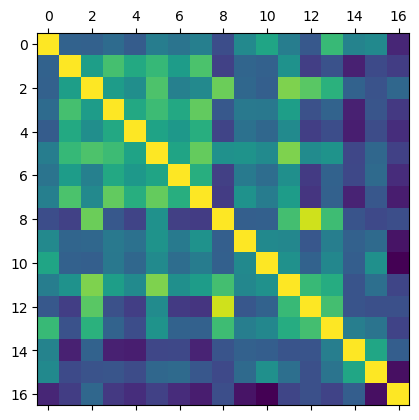

In [62]:
import matplotlib.pyplot as plt

plt.matshow(z_score_2.corr())
plt.show()

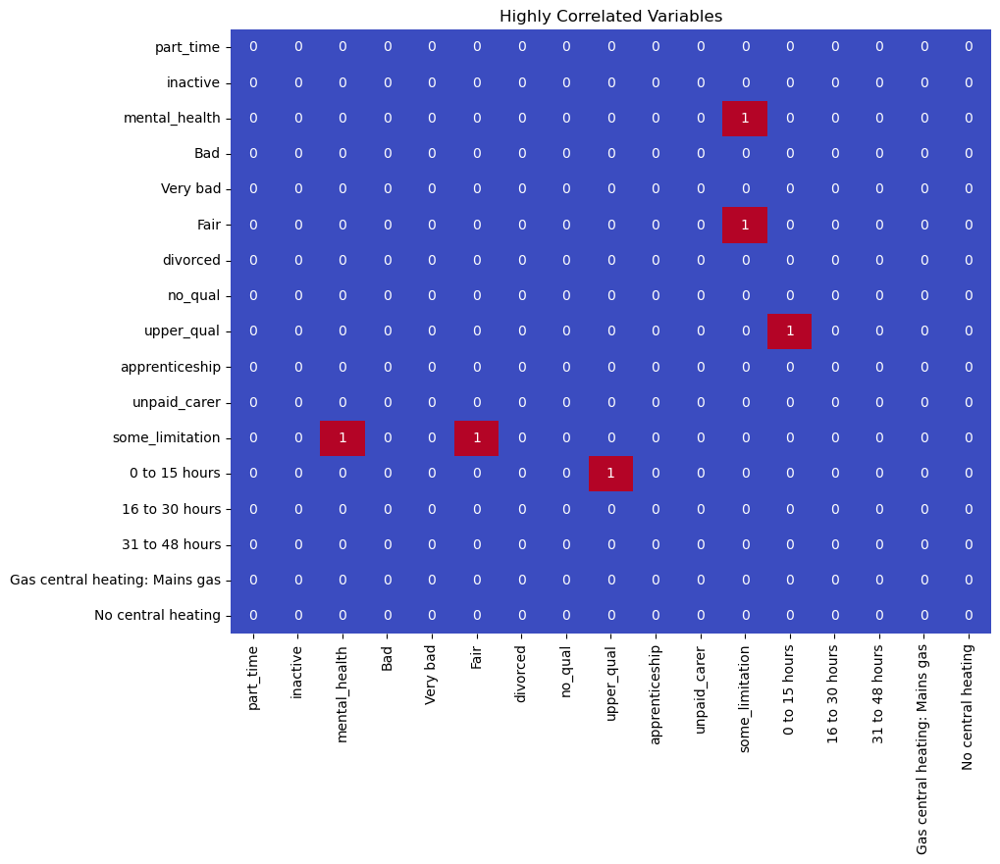

In [64]:
import seaborn as sns

threshold = 0.75 
highly_correlated_2 = (corr2.abs() > threshold) & (corr2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()


In [66]:
z_score_2.drop(['some_limitation', 'mental_health', 'Fair', 'upper_qual', '0 to 15 hours'], axis=1, inplace=True)
z_score_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4452 entries, 0 to 4451
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   part_time                       4433 non-null   float64
 1   inactive                        3217 non-null   float64
 2   Bad                             3952 non-null   float64
 3   Very bad                        2477 non-null   float64
 4   divorced                        4345 non-null   float64
 5   no_qual                         4188 non-null   float64
 6   apprenticeship                  3906 non-null   float64
 7   unpaid_carer                    4428 non-null   float64
 8   16 to 30 hours                  4444 non-null   float64
 9   31 to 48 hours                  4448 non-null   float64
 10  Gas central heating: Mains gas  4450 non-null   float64
 11  No central heating              2579 non-null   float64
dtypes: float64(12)
memory usage: 417.5

In [77]:
# check for nan values in the df
# as this is true, the next steps remove these values
contains_nan_2 = z_score_2.isna().any().any()
print(contains_nan_2)

False


In [68]:
z_score_2.fillna(z_score_2.mean(), inplace=True)

In [70]:
# clustering the new variable selection with 10 clusters

from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

# KMeans with 10 clusters
kmeans_2 = KMeans(n_clusters=10)
kmeans_2.fit(z_score_2)
labels_2 = kmeans_2.predict(z_score_2)
cluster_centres_2 = kmeans_2.cluster_centers_
z_score_2['Cluster'] = kmeans_2.labels_

In [71]:
z_score_2.head()

,part_time,inactive,Bad,Very bad,divorced,no_qual,apprenticeship,unpaid_carer,16 to 30 hours,31 to 48 hours,Gas central heating: Mains gas,No central heating,Cluster
0,2.525714,-5.330964e-01,-1.003988,8.605685e-18,0.434276,-0.237717,-0.797342,2.849486,0.287379,0.557466,-2.639951,-0.778193,1
1,0.749026,-3.529335e-01,0.016330,-7.092273e-01,1.358110,-0.447441,0.263969,-0.676463,0.426908,-0.289461,0.026086,0.358895,7
2,0.156797,8.834849e-17,-0.748908,-1.938985e-01,0.203318,1.020625,4.509213,-0.340658,-0.131209,2.316468,0.170196,-0.778193,2
3,1.933485,-1.727705e-01,-0.238750,-7.092273e-01,1.358110,0.076869,0.263969,-0.004854,0.426908,1.274096,1.467186,-0.778193,8
4,0.354206,5.478813e-01,-0.238750,-1.938985e-01,0.434276,0.181730,-0.797342,0.666756,0.287379,-0.745499,-0.622410,0.737924,1


(array([ 622.,  813.,  219.,  230.,  247.,  206.,    5.,  519.,  385.,
        1206.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

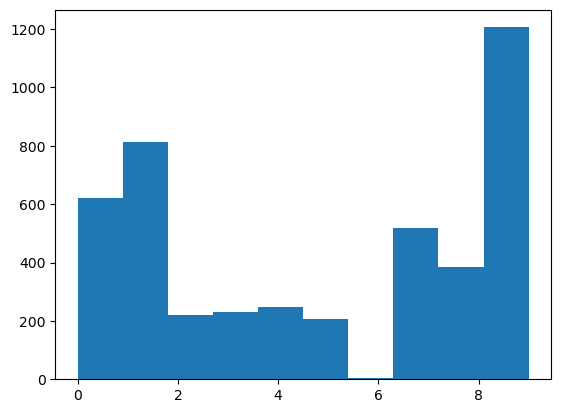

In [72]:
# plot histogram to assess distribution of clusters

plt.hist(labels_2)

# there is a better and more even distribution with these variables than the above variable selection
# although there is still no datapoints for cluster 6

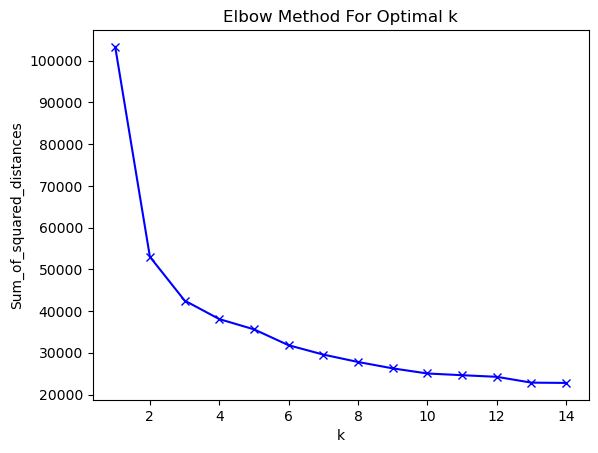

In [73]:
# assess the suitability of this number of clusters using the elbow method

Sum_of_squared_distances_2 = []

K_range_2 = range(1,15)

for k in K_range_2:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_2)
 Sum_of_squared_distances_2.append(km.inertia_)
    
plt.plot(K_range_2, Sum_of_squared_distances_2, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

# this shows the elbow lying around 5 or 6 clusters

In [109]:
# adjust to have 5 clusters

kmeans_2 = KMeans(n_clusters=4)
kmeans_2.fit(z_score_2)
labels_2 = kmeans_2.predict(z_score_2)
cluster_centres = kmeans_2.cluster_centers_

z_score_2['Cluster'] = kmeans_2.labels_

(array([1019.,    0.,    0., 1521.,    0.,    0., 1169.,    0.,    0.,
         743.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <BarContainer object of 10 artists>)

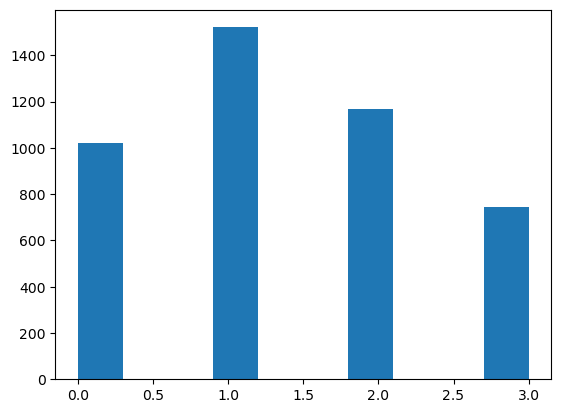

In [110]:
plt.hist(labels_2)

In [111]:
# evaluate the classification with the following plots

import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.figure(figsize=(12, 8))

kmeans_2 = KMeans(n_clusters=5)
clusters_2 = kmeans.fit_predict(z_score_2)

z_score_2['Cluster'] = clusters_2

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_2)

# PCA analysys.
pca_2 = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca_2.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca_2.explained_variance_ratio_

# Create a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")


/usr/local/Caskroom/miniforge/base/envs/ua/lib/python3.11/site-packages/sklearn/base.py:1389: ConvergenceWarning:

Number of distinct clusters (4) found smaller than n_clusters (5). Possibly due to duplicate points in X.



ValueError: n_components=2 must be between 0 and min(n_samples, n_features)=1 with svd_solver='covariance_eigh'

<Figure size 1200x800 with 0 Axes>

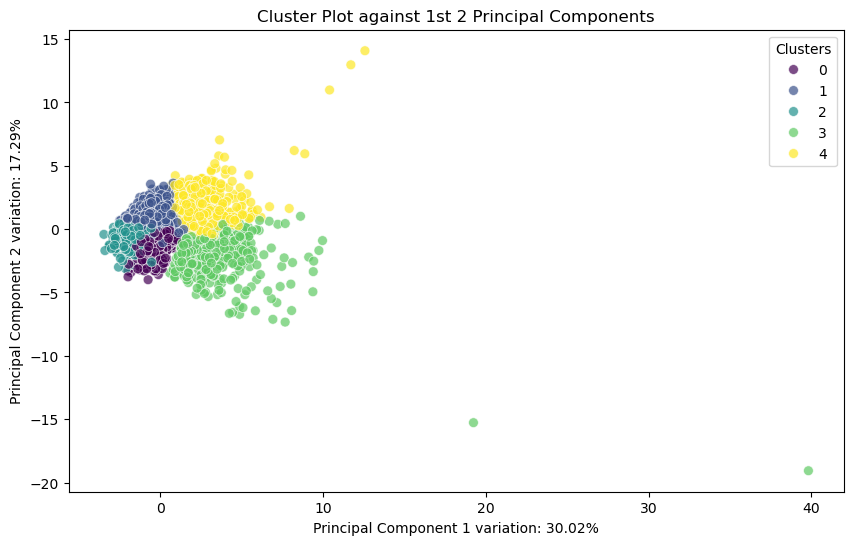

In [86]:
kmeans = KMeans(n_clusters=5)
clusters = kmeans.fit_predict(z_score_2)

z_score_2['Cluster'] = clusters

# Standardize the data for PCA
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_2)

# PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('Cluster Plot against 1st 2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()

In [87]:
# interpreting the clusters

kmeans = KMeans(n_clusters=5)
clusters = kmeans.fit_predict(z_score_2)

cluster_centers = kmeans.cluster_centers_

cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_2.columns)

cluster_centers.head(5)

,part_time,inactive,Bad,Very bad,divorced,no_qual,apprenticeship,unpaid_carer,16 to 30 hours,31 to 48 hours,Gas central heating: Mains gas,No central heating,Cluster
0,0.094259,-0.253647,-0.389538,-0.165194,-0.168219,-0.488793,-0.350768,-0.027891,0.131000,0.747522,0.596880,0.024712,1.000000
1,0.231316,1.495322,1.885688,1.056170,1.384828,1.813501,0.376620,0.383709,0.080889,-0.503828,0.116630,-0.130194,3.038369
2,-0.748562,-0.236016,-0.433558,-0.160263,-0.590336,-0.533974,-0.433735,-0.735694,-0.481238,-0.405354,-0.768905,0.226013,1.992360
3,1.411759,0.006250,0.291124,-0.018536,0.446537,0.486109,0.974023,1.169347,1.090947,0.731699,0.865012,-0.146873,3.986711
4,-0.170641,-0.040752,0.019211,-0.038963,0.050195,0.163580,0.183180,0.034813,-0.269562,-0.627756,-0.368288,-0.146665,0.289675


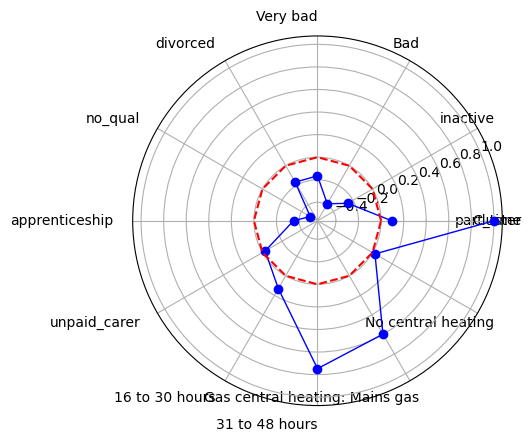

In [88]:
first_row_centers = cluster_centers.iloc[0, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()

In [96]:
# map the 2nd geodemographic classification

list(z_score_2.columns)

['part_time',
 'inactive',
 'Bad',
 'Very bad',
 'divorced',
 'no_qual',
 'apprenticeship',
 'unpaid_carer',
 '16 to 30 hours',
 '31 to 48 hours',
 'Gas central heating: Mains gas',
 'No central heating',
 'Cluster']

In [97]:
z_score_2.drop(['part_time',
 'inactive',
 'Bad',
 'Very bad',
 'divorced',
 'no_qual',
 'apprenticeship',
 'unpaid_carer',
 '16 to 30 hours',
 '31 to 48 hours',
 'Gas central heating: Mains gas',
 'No central heating'
], axis=1, inplace=True)
z_score_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4452 entries, 0 to 4451
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   mental_health    4438 non-null   float64
 1   Fair             4438 non-null   float64
 2   upper_qual       4426 non-null   float64
 3   some_limitation  4449 non-null   float64
 4   0 to 15 hours    4225 non-null   float64
dtypes: float64(5)
memory usage: 174.0 KB


In [98]:
final_df_2 = pd.concat([edinburgh_census_data_2, z_score_2], axis=1, ignore_index=False)
final_df_2.head()

,code,Popcount,HHcount,geometry,part_time,inactive,mental_health,Bad,Very bad,Fair,...,upper_qual,apprenticeship,unpaid_carer,some_limitation,0 to 15 hours,16 to 30 hours,31 to 48 hours,Gas central heating: Mains gas,No central heating,Cluster
0,S00181358,152,57,"MULTIPOLYGON (((311997.177 665293.940, 311996....",23.0,2.0,16.0,1.0,NaN,17.0,...,6.0,2.0,28.0,17.0,15.0,14.0,47.0,6.0,1.0,4
1,S00145082,107,53,"POLYGON ((322939.000 669278.000, 322860.000 66...",14.0,3.0,16.0,5.0,1.0,20.0,...,12.0,6.0,7.0,16.0,7.0,15.0,34.0,43.0,4.0,1
2,S00144968,163,74,"POLYGON ((322558.129 669284.705, 322557.158 66...",11.0,NaN,10.0,2.0,2.0,21.0,...,23.0,22.0,9.0,25.0,2.0,11.0,74.0,45.0,1.0,4
3,S00145050,161,73,"POLYGON ((323160.000 669427.000, 323156.000 66...",20.0,4.0,20.0,4.0,1.0,13.0,...,10.0,6.0,11.0,13.0,10.0,15.0,58.0,63.0,1.0,4
4,S00145009,107,41,"POLYGON ((322732.999 669511.000, 322828.000 66...",12.0,8.0,19.0,4.0,2.0,11.0,...,2.0,2.0,15.0,10.0,5.0,14.0,27.0,34.0,5.0,1


In [99]:
final_df_2.columns

Index(['code', 'Popcount', 'HHcount', 'geometry', 'part_time', 'inactive',
       'mental_health', 'Bad', 'Very bad', 'Fair', 'divorced', 'single',
       'no_qual', 'upper_qual', 'apprenticeship', 'unpaid_carer',
       'some_limitation', '0 to 15 hours', '16 to 30 hours', '31 to 48 hours',
       'Gas central heating: Mains gas', 'No central heating', 'Cluster'],
      dtype='object')

In [105]:
# renaming the clusters using a dictionary 
# as the cluster values are integers and not string, this is the best method to rename

def rename_column(x): 
    rename_clusters = {
        0: "Very high priority",
        1: "High priority",
        2: "Moderate priority",
        3: "Low priority",
        4: "Very low priority"
    }
    return rename_clusters.get(x, x)  
    
final_df_2['Cluster'] = final_df_2['Cluster'].apply(rename_column)
final_df_2.head()

,code,Popcount,HHcount,geometry,part_time,inactive,mental_health,Bad,Very bad,Fair,...,upper_qual,apprenticeship,unpaid_carer,some_limitation,0 to 15 hours,16 to 30 hours,31 to 48 hours,Gas central heating: Mains gas,No central heating,Cluster
0,S00181358,152,57,"MULTIPOLYGON (((311997.177 665293.940, 311996....",23.0,2.0,16.0,1.0,NaN,17.0,...,6.0,2.0,28.0,17.0,15.0,14.0,47.0,6.0,1.0,Low priority
1,S00145082,107,53,"POLYGON ((322939.000 669278.000, 322860.000 66...",14.0,3.0,16.0,5.0,1.0,20.0,...,12.0,6.0,7.0,16.0,7.0,15.0,34.0,43.0,4.0,High priority
2,S00144968,163,74,"POLYGON ((322558.129 669284.705, 322557.158 66...",11.0,NaN,10.0,2.0,2.0,21.0,...,23.0,22.0,9.0,25.0,2.0,11.0,74.0,45.0,1.0,Low priority
3,S00145050,161,73,"POLYGON ((323160.000 669427.000, 323156.000 66...",20.0,4.0,20.0,4.0,1.0,13.0,...,10.0,6.0,11.0,13.0,10.0,15.0,58.0,63.0,1.0,Low priority
4,S00145009,107,41,"POLYGON ((322732.999 669511.000, 322828.000 66...",12.0,8.0,19.0,4.0,2.0,11.0,...,2.0,2.0,15.0,10.0,5.0,14.0,27.0,34.0,5.0,High priority


In [106]:
final_df_2.explore(column='Cluster', cmap='Set1', tiles='CartoDB positron')

/usr/local/Caskroom/miniforge/base/envs/ua/lib/python3.11/site-packages/folium/features.py:1173: UserWarning:

GeoJsonTooltip is not configured to render for GeoJson GeometryCollection geometries. Please consider reworking these features: [{'code': 'S00180507', 'Popcount': 91, 'HHcount': 43, 'part_time': 11.0, 'inactive': 5.0, 'mental_health': 7.0, 'Bad': 3.0, 'Very bad': 1.0, 'Fair': 5.0, 'divorced': 9.0, 'single': 19, 'no_qual': 8.0, 'upper_qual': 8.0, 'apprenticeship': 4.0, 'unpaid_carer': 5.0, 'some_limitation': 6.0, '0 to 15 hours': 3.0, '16 to 30 hours': 10.0, '31 to 48 hours': 39.0, 'Gas central heating: Mains gas': 11.0, 'No central heating': 6.0, 'Cluster': 'High priority', '__folium_color': '#e41a1c'}, {'code': 'S00180396', 'Popcount': 105, 'HHcount': 47, 'part_time': 13.0, 'inactive': 1.0, 'mental_health': 5.0, 'Bad': 3.0, 'Very bad': None, 'Fair': 16.0, 'divorced': 6.0, 'single': 24, 'no_qual': 10.0, 'upper_qual': 7.0, 'apprenticeship': 5.0, 'unpaid_carer': 25.0, 'some_limi